### LSE Data Analytics Online Career Accelerator 

# DA301:  Advanced Analytics for Organisational Impact

## Assignment template

### Scenario
You are a data analyst working for Turtle Games, a game manufacturer and retailer. They manufacture and sell their own products, along with sourcing and selling products manufactured by other companies. Their product range includes books, board games, video games and toys. They have a global customer base and have a business objective of improving overall sales performance by utilising customer trends. In particular, Turtle Games wants to understand: 
- how customers accumulate loyalty points (Week 1)
- how useful are remuneration and spending scores data (Week 2)
- can social data (e.g. customer reviews) be used in marketing campaigns (Week 3)
- what is the impact on sales per product (Week 4)
- the reliability of the data (e.g. normal distribution, Skewness, Kurtosis) (Week 5)
- if there is any possible relationship(s) in sales between North America, Europe, and global sales (Week 6).

# Week 1 assignment: Linear regression using Python
The marketing department of Turtle Games prefers Python for data analysis. As you are fluent in Python, they asked you to assist with data analysis of social media data. The marketing department wants to better understand how users accumulate loyalty points. Therefore, you need to investigate the possible relationships between the loyalty points, age, remuneration, and spending scores. Note that you will use this data set in future modules as well and it is, therefore, strongly encouraged to first clean the data as per provided guidelines and then save a copy of the clean data for future use.

## Instructions
1. Load and explore the data.
    1. Create a new DataFrame (e.g. reviews).
    2. Sense-check the DataFrame.
    3. Determine if there are any missing values in the DataFrame.
    4. Create a summary of the descriptive statistics.
2. Remove redundant columns (`language` and `platform`).
3. Change column headings to names that are easier to reference (e.g. `renumeration` and `spending_score`).
4. Save a copy of the clean DataFrame as a CSV file. Import the file to sense-check.
5. Use linear regression and the `statsmodels` functions to evaluate possible linear relationships between loyalty points and age/renumeration/spending scores to determine whether these can be used to predict the loyalty points.
    1. Specify the independent and dependent variables.
    2. Create the OLS model.
    3. Extract the estimated parameters, standard errors, and predicted values.
    4. Generate the regression table based on the X coefficient and constant values.
    5. Plot the linear regression and add a regression line.
6. Include your insights and observations.

## 1. Load and explore the data

In [1]:
# Import libraries and packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm 
from statsmodels.formula.api import ols

In [2]:
# Load the CSV file(s) as reviews.
df1 = pd.read_csv('turtle_reviews.csv')

# View the DataFrame.
df1

,gender,age,remuneration (k£),spending_score (1-100),loyalty_points,education,language,platform,product,review,summary
0,Male,18,12.30,39,210,graduate,EN,Web,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,EN,Web,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,EN,Web,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,EN,Web,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,EN,Web,291,As my review of GF9's previous screens these w...,Money trap
...,...,...,...,...,...,...,...,...,...,...,...
1995,Female,37,84.46,69,4031,PhD,EN,Web,977,The perfect word game for mixed ages (with Mom...,The perfect word game for mixed ages (with Mom
1996,Female,43,92.66,8,539,PhD,EN,Web,979,Great game. Did not think I would like it whe...,Super fun
1997,Male,34,92.66,91,5614,graduate,EN,Web,1012,Great game for all.........\nKeeps the mind ni...,Great Game
1998,Male,34,98.40,16,1048,PhD,EN,Web,1031,fun game!,Four Stars


In [3]:
# Identify missing values
df1.isna().sum()

gender                    0
age                       0
remuneration (k£)         0
spending_score (1-100)    0
loyalty_points            0
education                 0
language                  0
platform                  0
product                   0
review                    0
summary                   0
dtype: int64

In [4]:
# Explore the data.
df1.dtypes

gender                     object
age                         int64
remuneration (k£)         float64
spending_score (1-100)      int64
loyalty_points              int64
education                  object
language                   object
platform                   object
product                     int64
review                     object
summary                    object
dtype: object

In [5]:
#Get the shape of the dataframe
df1.shape

(2000, 11)

In [6]:
# Get the Descriptive statistics.
df1.describe()


,age,remuneration (k£),spending_score (1-100),loyalty_points,product
count,2000.000000,2000.000000,2000.000000,2000.000000,2000.000000
mean,39.495000,48.079060,50.000000,1578.032000,4320.521500
std,13.573212,23.123984,26.094702,1283.239705,3148.938839
min,17.000000,12.300000,1.000000,25.000000,107.000000
25%,29.000000,30.340000,32.000000,772.000000,1589.250000
50%,38.000000,47.150000,50.000000,1276.000000,3624.000000
75%,49.000000,63.960000,73.000000,1751.250000,6654.000000
max,72.000000,112.340000,99.000000,6847.000000,11086.000000


## 2. Drop columns

In [7]:
# Drop unnecessary columns.
columns_to_drop = ['language', 'platform']
df1 = df1.drop(columns=columns_to_drop)


# View column names.
print(df1.columns)

Index(['gender', 'age', 'remuneration (k£)', 'spending_score (1-100)',
       'loyalty_points', 'education', 'product', 'review', 'summary'],
      dtype='object')


## 3. Rename columns

In [8]:
# Rename the column headers.
df1 = df1.rename(columns = {'remuneration (k£)': 'remuneration', 'spending_score (1-100)': 'spending_score'})

# View column names.
print(df1.columns)

Index(['gender', 'age', 'remuneration', 'spending_score', 'loyalty_points',
       'education', 'product', 'review', 'summary'],
      dtype='object')


## 4. Save the DataFrame as a CSV file

In [9]:
# Create a CSV file as output.
df1.to_csv('reviews_df.csv', index=False)


In [10]:
# Import new CSV file with Pandas.
df2 = pd.read_csv('reviews_df.csv')

# View DataFrame.
df2.info()
df2.shape

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   gender          2000 non-null   object 
 1   age             2000 non-null   int64  
 2   remuneration    2000 non-null   float64
 3   spending_score  2000 non-null   int64  
 4   loyalty_points  2000 non-null   int64  
 5   education       2000 non-null   object 
 6   product         2000 non-null   int64  
 7   review          2000 non-null   object 
 8   summary         2000 non-null   object 
dtypes: float64(1), int64(4), object(4)
memory usage: 140.8+ KB


(2000, 9)

## 5. Linear regression

### 5a) spending vs loyalty

In [11]:
# Independent variable.
x = df2['spending_score']

# Dependent variable.
y = df2['loyalty_points']

# OLS model and summary.
f = 'y ~ x'
test = ols(f, df2).fit()

test.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.452
Model:                            OLS   Adj. R-squared:                  0.452
Method:                 Least Squares   F-statistic:                     1648.
Date:                Sun, 15 Oct 2023   Prob (F-statistic):          2.92e-263
Time:                        15:57:43   Log-Likelihood:                -16550.
No. Observations:                2000   AIC:                         3.310e+04
Df Residuals:                    1998   BIC:                         3.312e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -75.0527     45.931     -1.634      0.102    -165.129      15.024
x             33.0617      0.814     40.595      0.000      31.464      34.659
==============================================================================
Omnibus:                      126.554   Durbin-Watson:                   1.191
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              260.528
Skew:                           0.422   Prob(JB):                     2.67e-57
Kurtosis:                       4.554   Cond. No.                         122.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [12]:
# Extract the estimated parameters.
print("Parameters: ", test.params)  

# Extract the standard errors.
print("Standard errors: ", test.bse)  
  
# Extract the predicted values.
print("Predicted values: ", test.predict())  


Parameters:  Intercept   -75.052663
x            33.061693
dtype: float64
Standard errors:  Intercept    45.930554
x             0.814419
dtype: float64
Predicted values:  [1214.35337415 2602.94449102  123.31749662 ... 2933.56142361  453.93442921
  189.44088314]


In [13]:
# Set the X coefficient and the constant to generate the regression table.
y_pred = (-75.052663) + 33.061693 * df2['spending_score']

# View the output.
y_pred

0       1214.353364
1       2602.944470
2        123.317495
3       2470.697698
4       1247.415057
           ...     
1995    2206.204154
1996     189.440881
1997    2933.561400
1998     453.934425
1999     189.440881
Name: spending_score, Length: 2000, dtype: float64

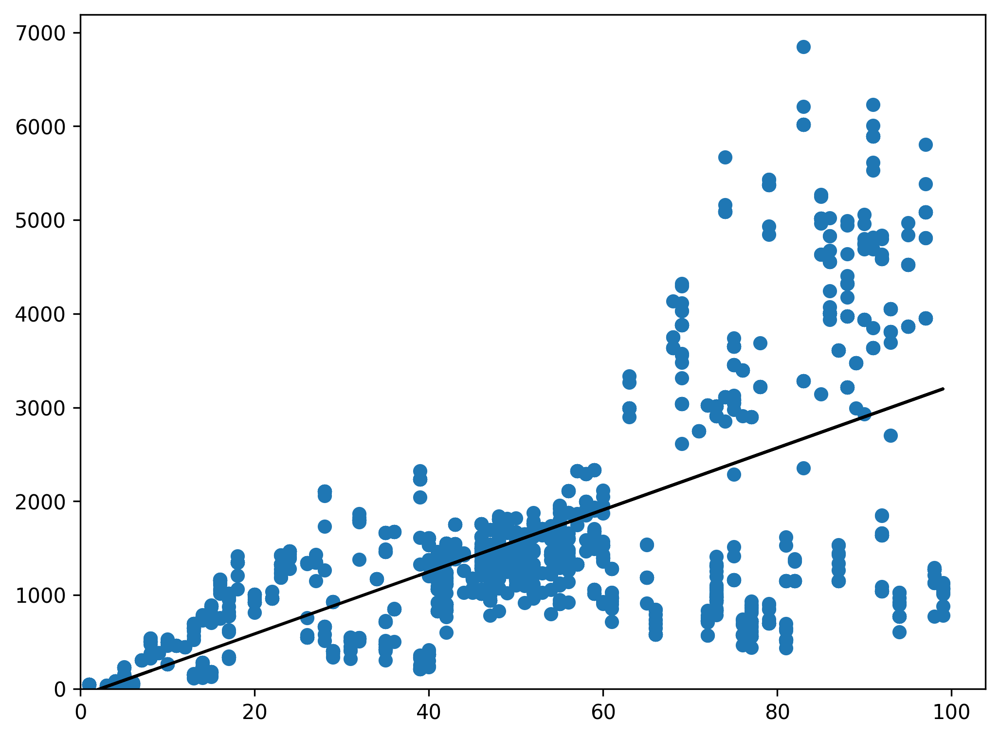

In [14]:
# Plot the graph with a regression line.
plt.figure(figsize=(8, 6), dpi=300)

plt.scatter(x,y)

plt.plot(x, y_pred, color='black')

plt.xlim(0)
plt.ylim(0)

plt.show()

### 5b) renumeration vs loyalty

In [15]:
# Independent variable.
x = df2['remuneration']

# Dependent variable.
y = df2['loyalty_points']

# OLS model and summary.
f = 'y ~ x'
test = ols(f, df2).fit()

test.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.380
Model:                            OLS   Adj. R-squared:                  0.379
Method:                 Least Squares   F-statistic:                     1222.
Date:                Sun, 15 Oct 2023   Prob (F-statistic):          2.43e-209
Time:                        15:57:44   Log-Likelihood:                -16674.
No. Observations:                2000   AIC:                         3.335e+04
Df Residuals:                    1998   BIC:                         3.336e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    -65.6865     52.171     -1.259      0.208    -168.001      36.628
x             34.1878      0.978     34.960      0.000      32.270      36.106
==============================================================================
Omnibus:                       21.285   Durbin-Watson:                   3.622
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               31.715
Skew:                           0.089   Prob(JB):                     1.30e-07
Kurtosis:                       3.590   Cond. No.                         123.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [16]:
# Extract the estimated parameters.
print("Parameters: ", test.params)  

# Extract the standard errors.
print("Standard errors: ", test.bse)  
  
# Extract the predicted values.
print("Predicted values: ", test.predict())


Parameters:  Intercept   -65.686513
x            34.187825
dtype: float64
Standard errors:  Intercept    52.170717
x             0.977925
dtype: float64
Predicted values:  [ 354.82374068  354.82374068  382.85775758 ... 3102.15739671 3298.39551499
 3102.15739671]


In [17]:
# Set the the X coefficient and the constant to generate the regression table.
y_pred = (-65.686513) + 34.187825 * df2['remuneration']

# View the output.
y_pred



0        354.823735
1        354.823735
2        382.857751
3        382.857751
4        410.891767
           ...     
1995    2821.817186
1996    3102.157351
1997    3102.157351
1998    3298.395467
1999    3102.157351
Name: remuneration, Length: 2000, dtype: float64

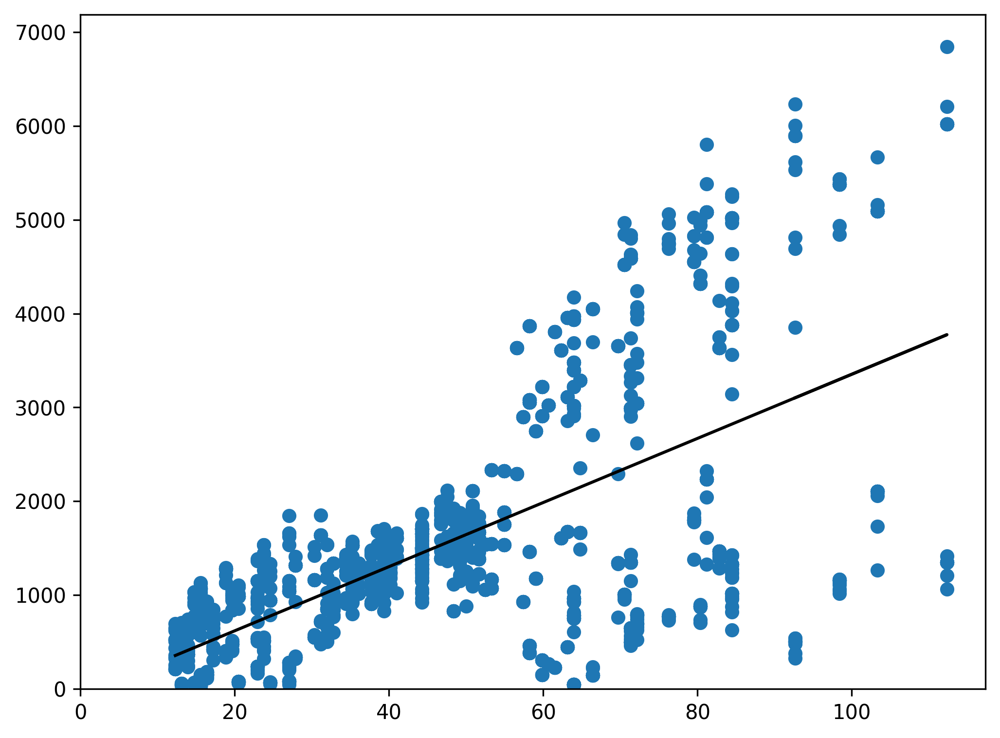

In [18]:
# Plot graph with regression line.
plt.figure(figsize=(8, 6), dpi=300)

plt.scatter(x,y)

plt.plot(x, y_pred, color='black')

plt.xlim(0)
plt.ylim(0)

plt.show()

### 5c) age vs loyalty

In [19]:
# Independent variable.
x = df2['age']

# Dependent variable.
y = df2['loyalty_points']

# OLS model and summary.
f = 'y ~ x'
test = ols(f, df2).fit()

test.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                      y   R-squared:                       0.002
Model:                            OLS   Adj. R-squared:                  0.001
Method:                 Least Squares   F-statistic:                     3.606
Date:                Sun, 15 Oct 2023   Prob (F-statistic):             0.0577
Time:                        15:57:44   Log-Likelihood:                -17150.
No. Observations:                2000   AIC:                         3.430e+04
Df Residuals:                    1998   BIC:                         3.431e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   1736.5177     88.249     19.678      0.000    1563.449    1909.587
x             -4.0128      2.113     -1.899      0.058      -8.157       0.131
==============================================================================
Omnibus:                      481.477   Durbin-Watson:                   2.277
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              937.734
Skew:                           1.449   Prob(JB):                    2.36e-204
Kurtosis:                       4.688   Cond. No.                         129.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [20]:
# Extract the estimated parameters.
print("Parameters: ", test.params)  

# Extract the standard errors.
print("Standard errors: ", test.bse)  
  
# Extract the predicted values.
print("Predicted values: ", test.predict())

Parameters:  Intercept    1736.517739
x              -4.012805
dtype: float64
Standard errors:  Intercept    88.248731
x             2.113177
dtype: float64
Predicted values:  [1664.2872467  1644.22322095 1648.2360261  ... 1600.0823643  1600.0823643
 1608.1079746 ]


In [21]:
# Set the the X coefficient and the constant to generate the regression table.
y_pred = (1736.517739) + -4.012805 * df2['age']

# View the output.
y_pred


0       1664.287249
1       1644.223224
2       1648.236029
3       1636.197614
4       1604.095174
           ...     
1995    1588.043954
1996    1563.967124
1997    1600.082369
1998    1600.082369
1999    1608.107979
Name: age, Length: 2000, dtype: float64

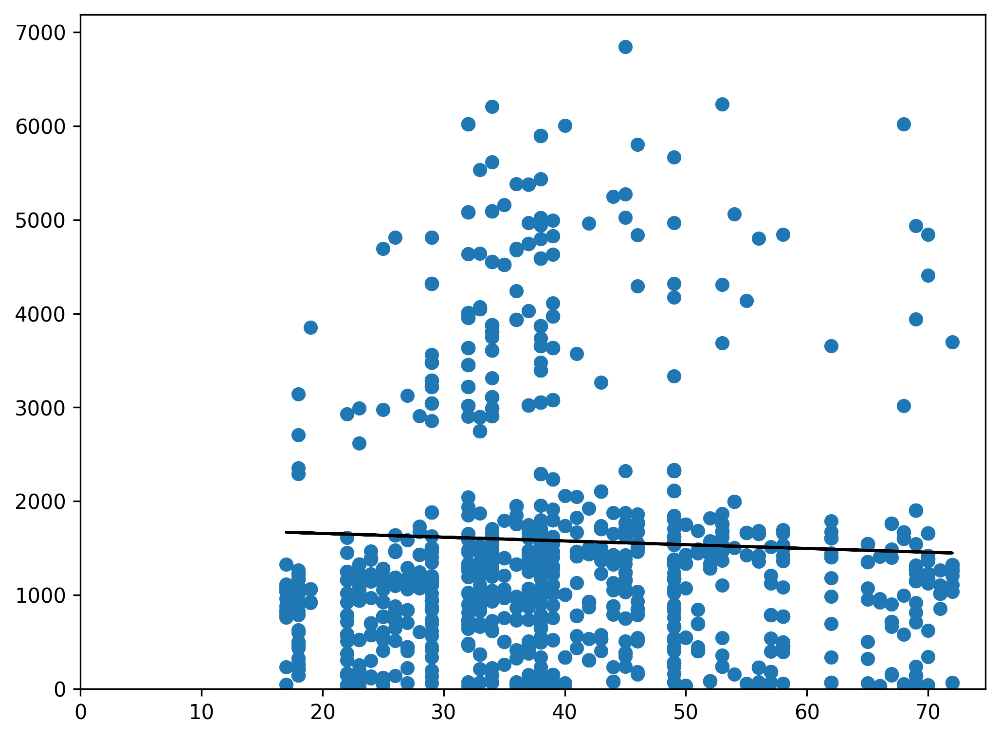

In [22]:
# Plot graph with regression line.
# Plot graph with regression line.
plt.figure(figsize=(8, 6), dpi=300)

plt.scatter(x,y)

plt.plot(x, y_pred, color='black')

plt.xlim(0)
plt.ylim(0)

plt.show()

# 

# Week 2 assignment: Clustering with *k*-means using Python

The marketing department also wants to better understand the usefulness of renumeration and spending scores but do not know where to begin. You are tasked to identify groups within the customer base that can be used to target specific market segments. Use *k*-means clustering to identify the optimal number of clusters and then apply and plot the data using the created segments.

## Instructions
1. Prepare the data for clustering. 
    1. Import the CSV file you have prepared in Week 1.
    2. Create a new DataFrame (e.g. `df2`) containing the `renumeration` and `spending_score` columns.
    3. Explore the new DataFrame. 
2. Plot the renumeration versus spending score.
    1. Create a scatterplot.
    2. Create a pairplot.
3. Use the Silhouette and Elbow methods to determine the optimal number of clusters for *k*-means clustering.
    1. Plot both methods and explain how you determine the number of clusters to use.
    2. Add titles and legends to the plot.
4. Evaluate the usefulness of at least three values for *k* based on insights from the Elbow and Silhoutte methods.
    1. Plot the predicted *k*-means.
    2. Explain which value might give you the best clustering.
5. Fit a final model using your selected value for *k*.
    1. Justify your selection and comment on the respective cluster sizes of your final solution.
    2. Check the number of observations per predicted class.
6. Plot the clusters and interpret the model.

## 1. Load and explore the data

In [23]:
!pip install scikit-learn


# Import necessary libraries.
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.metrics import accuracy_score
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings('ignore')

In [24]:
# Load the CSV file(s) as df3.
df3 = pd.read_csv('reviews_df.csv')

# View DataFrame.
df3

,gender,age,remuneration,spending_score,loyalty_points,education,product,review,summary
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,291,As my review of GF9's previous screens these w...,Money trap
...,...,...,...,...,...,...,...,...,...
1995,Female,37,84.46,69,4031,PhD,977,The perfect word game for mixed ages (with Mom...,The perfect word game for mixed ages (with Mom
1996,Female,43,92.66,8,539,PhD,979,Great game. Did not think I would like it whe...,Super fun
1997,Male,34,92.66,91,5614,graduate,1012,Great game for all.........\nKeeps the mind ni...,Great Game
1998,Male,34,98.40,16,1048,PhD,1031,fun game!,Four Stars


In [25]:
# Drop unnecessary columns.
columns_to_drop = ['gender', 'age', 'loyalty_points', 'education', 'product', 'review', 'summary']
df3 = df3.drop(columns=columns_to_drop)


# View column names.
print(df3.columns)

Index(['remuneration', 'spending_score'], dtype='object')


In [26]:
# Explore the data.
df3.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 2 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   remuneration    2000 non-null   float64
 1   spending_score  2000 non-null   int64  
dtypes: float64(1), int64(1)
memory usage: 31.4 KB


In [27]:
#Get the shape of the dataframe
df3.shape

(2000, 2)

In [28]:
# Get the descriptive statistics.
df3.describe()

,remuneration,spending_score
count,2000.000000,2000.000000
mean,48.079060,50.000000
std,23.123984,26.094702
min,12.300000,1.000000
25%,30.340000,32.000000
50%,47.150000,50.000000
75%,63.960000,73.000000
max,112.340000,99.000000


## 2. Plot

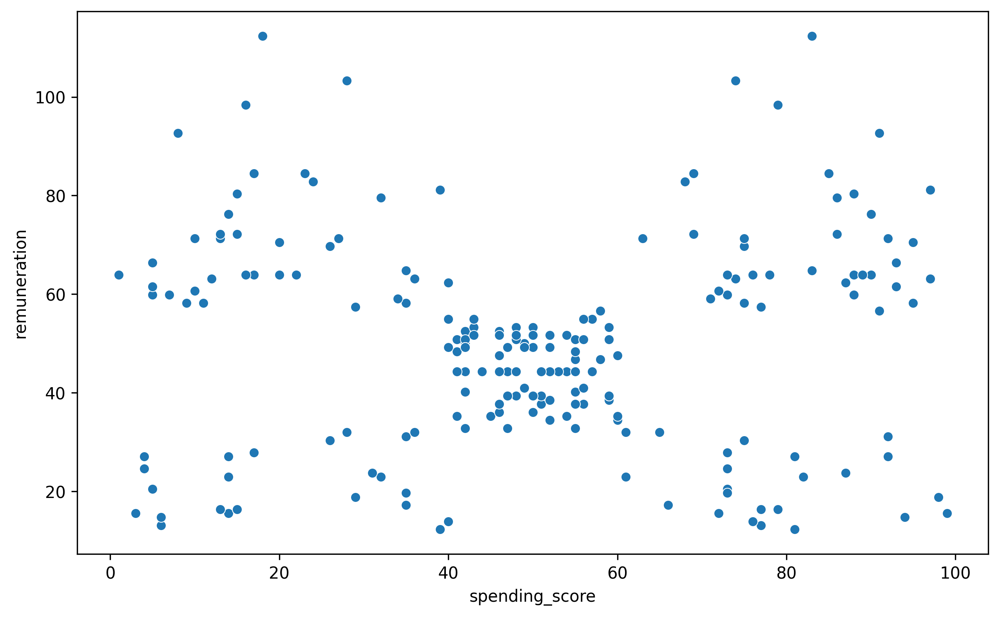

In [29]:
# Create a scatterplot with Seaborn.

# Adjust the figsize and dpi values    
plt.figure(figsize=(10, 6), dpi=300)

sns.scatterplot(data=df3, y='remuneration', x='spending_score')

plt.show()

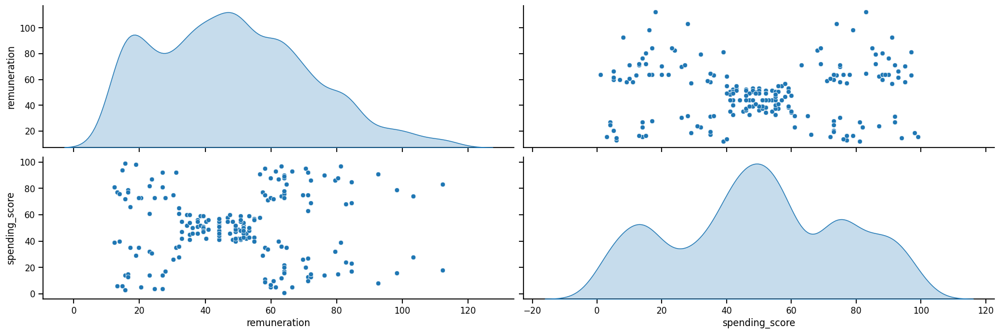

In [30]:
# Create a pairplot with Seaborn.

#create a new dataframe with remuneration and spending score
x = df3[['remuneration', 'spending_score']]

# Set the DPI for the entire Seaborn plot.
sns.set_context("notebook", rc={"figure.dpi": 300})

# Create and display the pairplot.
g = sns.pairplot(df3, vars=x, diag_kind='kde', height=3, aspect=3)

plt.show()


## 3. Elbow and silhoutte methods

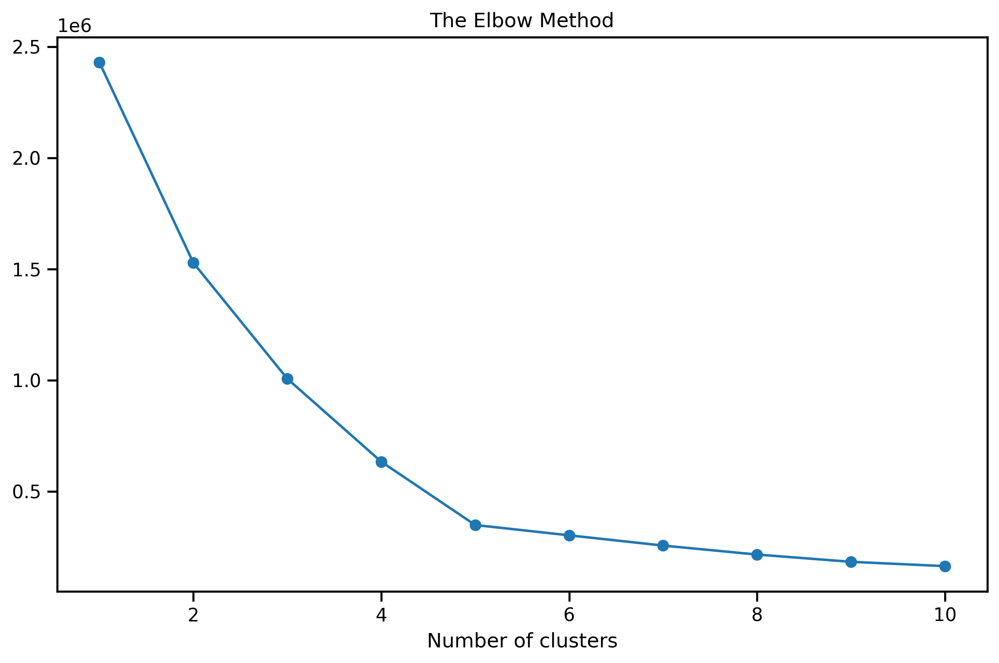

In [31]:
# Determine the number of clusters: Elbow method.
from sklearn.cluster import KMeans 

ss = []

for i in range(1,11):
    kmeans = KMeans(n_clusters=i,
                   init = 'k-means++',
                   max_iter = 500,
                   n_init=10,
                   random_state=42)
    
    kmeans.fit(x)
    ss.append(kmeans.inertia_)

# Adjust the figsize and dpi values    
plt.figure(figsize=(10, 6), dpi=300)  

plt.plot(range(1,11), ss, marker='o')
plt.title('The Elbow Method')
plt.xlabel("Number of clusters")

plt.show()


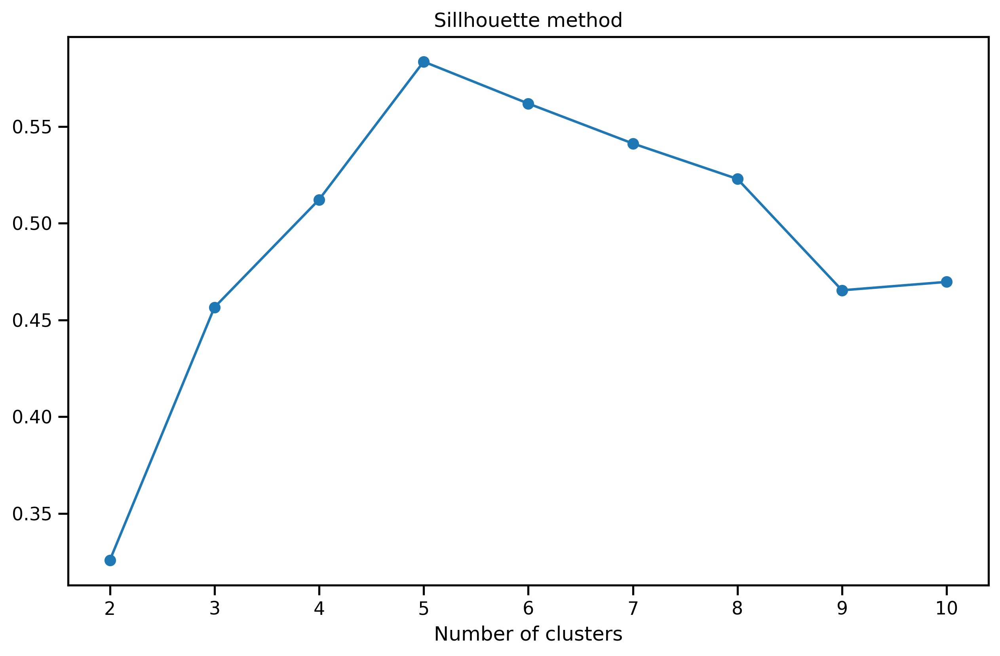

In [32]:
# Determine the number of clusters: Silhouette method.
from sklearn.metrics import silhouette_score

sil = []
kmax=10

for k in range(2, kmax+1):
    
    kmeans_s = KMeans(n_clusters=k).fit(x)
    labels = kmeans_s.labels_
    sil.append(silhouette_score(x, labels, metric='euclidean'))
               
# Adjust the figsize and dpi values
plt.figure(figsize=(10, 6), dpi=300)          
plt.plot(range(2,kmax+1), sil, marker='o')
plt.title('Sillhouette method')
plt.xlabel("Number of clusters")

plt.show()

## 4. Evaluate k-means model at different values of *k*

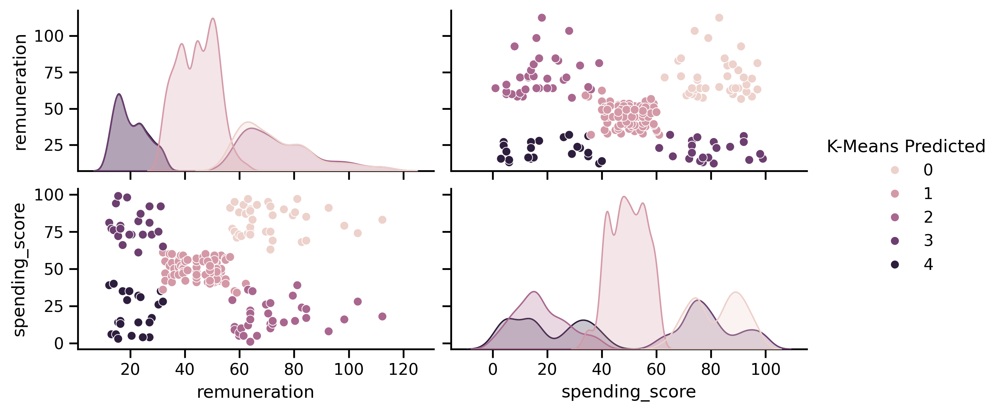

In [33]:
# Set the DPI (resolution)
plt.rcParams['figure.dpi'] = 300

# Create the K-Means clusters and add the labels to your DataFrame.
kmeans = KMeans(n_clusters=5, max_iter=15000, init='k-means++', random_state=42).fit(x)
clusters = kmeans.labels_
x['K-Means Predicted'] = clusters

# Create and display the pairplot with K-Means clustering labels.
sns.pairplot(x, hue='K-Means Predicted', diag_kind='kde', height=2, aspect=2)

plt.show()


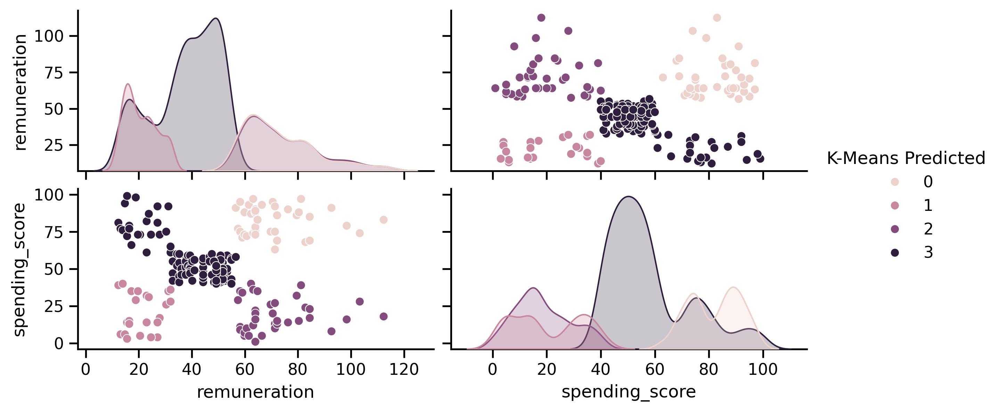

In [34]:
# Set the DPI (resolution)
plt.rcParams['figure.dpi'] = 300

# Create the K-Means clusters and add the labels to your DataFrame.
kmeans = KMeans(n_clusters=4, max_iter=15000, init='k-means++', random_state=42).fit(x)
clusters = kmeans.labels_
x['K-Means Predicted'] = clusters

# Create and display the pairplot with K-Means clustering labels.
sns.pairplot(x, hue='K-Means Predicted', diag_kind='kde', height=2, aspect=2)

plt.show()

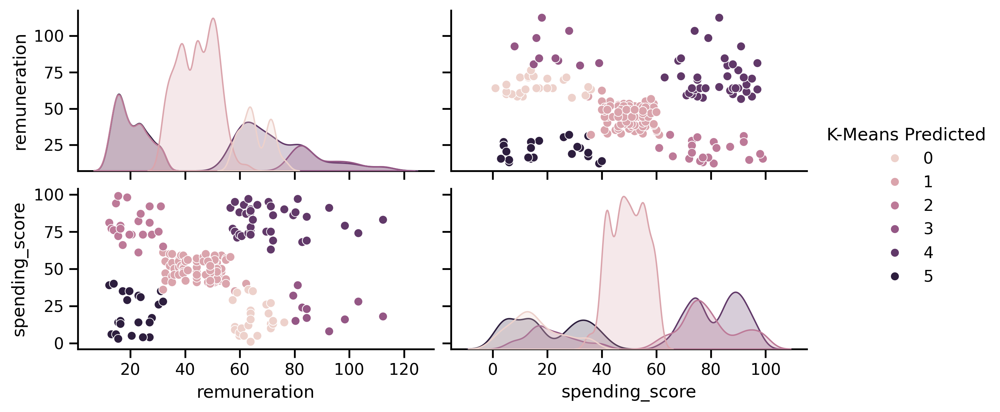

In [35]:
# Set the DPI (resolution)
plt.rcParams['figure.dpi'] = 300

# Create the K-Means clusters and add the labels to your DataFrame.
kmeans = KMeans(n_clusters=6, max_iter=15000, init='k-means++', random_state=42).fit(x)
clusters = kmeans.labels_
x['K-Means Predicted'] = clusters

# Create and display the pairplot with K-Means clustering labels.
sns.pairplot(x, hue='K-Means Predicted', diag_kind='kde', height=2, aspect=2)

plt.show()

## 5. Fit final model and justify your choice

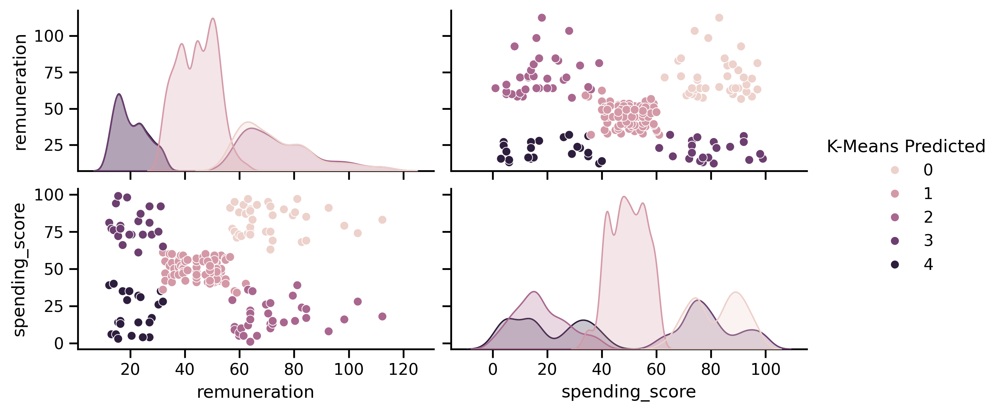

In [36]:
# Set the DPI (resolution)
plt.rcParams['figure.dpi'] = 300

# Create the K-Means clusters and add the labels to your DataFrame.
kmeans = KMeans(n_clusters=5, max_iter=15000, init='k-means++', random_state=42).fit(x)
clusters = kmeans.labels_
x['K-Means Predicted'] = clusters

# Create and display the pairplot with K-Means clustering labels.
sns.pairplot(x, hue='K-Means Predicted', diag_kind='kde', height=2, aspect=2)

plt.show()

In [37]:
# Check the number of observations per predicted class.
x['K-Means Predicted'].value_counts()

K-Means Predicted
1    774
0    356
2    330
4    271
3    269
Name: count, dtype: int64

## 6. Plot and interpret the clusters

,remuneration,spending_score,K-Means Predicted
0,12.30,39,4
1,12.30,81,3
2,13.12,6,4
3,13.12,77,3
4,13.94,40,4
...,...,...,...
1995,84.46,69,0
1996,92.66,8,2
1997,92.66,91,0
1998,98.40,16,2


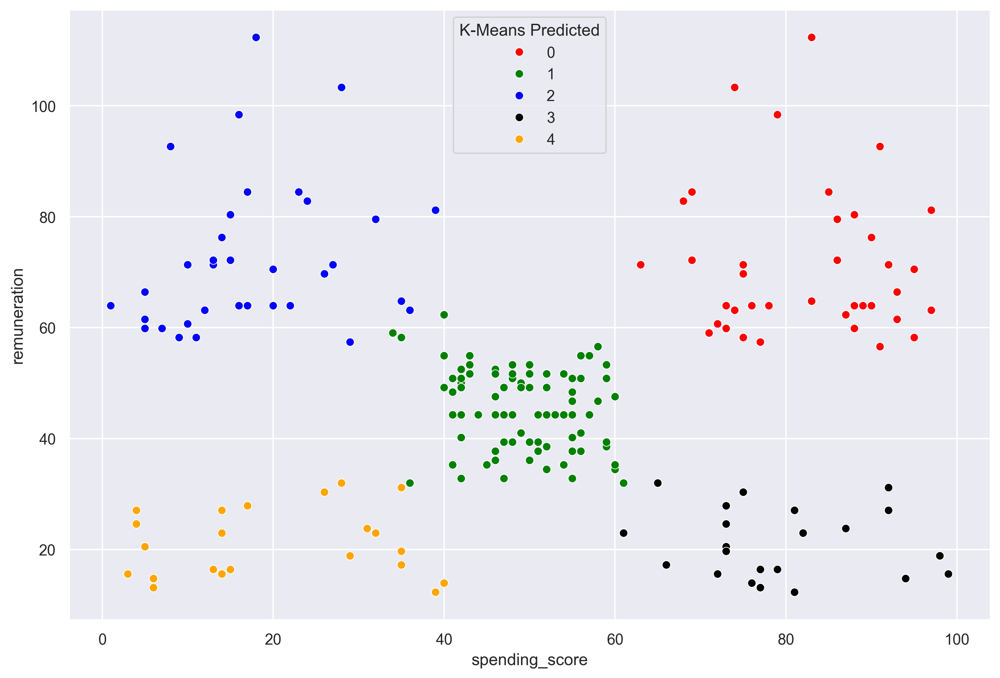

In [38]:
# Visualising the clusters.
# Set plot size.
sns.set(rc = {'figure.figsize':(12, 8)})

sns.scatterplot(x='spending_score' , 
                y ='remuneration',
                data=x ,
                hue='K-Means Predicted',
                palette=['red', 'green', 'blue', 'black', 'orange'])


# View the DataFrame.
x

# 

# Week 3 assignment: NLP using Python
Customer reviews were downloaded from the website of Turtle Games. This data will be used to steer the marketing department on how to approach future campaigns. Therefore, the marketing department asked you to identify the 15 most common words used in online product reviews. They also want to have a list of the top 20 positive and negative reviews received from the website. Therefore, you need to apply NLP on the data set.

## Instructions
1. Load and explore the data. 
    1. Sense-check the DataFrame.
    2. You only need to retain the `review` and `summary` columns.
    3. Determine if there are any missing values.
2. Prepare the data for NLP
    1. Change to lower case and join the elements in each of the columns respectively (`review` and `summary`).
    2. Replace punctuation in each of the columns respectively (`review` and `summary`).
    3. Drop duplicates in both columns (`review` and `summary`).
3. Tokenise and create wordclouds for the respective columns (separately).
    1. Create a copy of the DataFrame.
    2. Apply tokenisation on both columns.
    3. Create and plot a wordcloud image.
4. Frequency distribution and polarity.
    1. Create frequency distribution.
    2. Remove alphanumeric characters and stopwords.
    3. Create wordcloud without stopwords.
    4. Identify 15 most common words and polarity.
5. Review polarity and sentiment.
    1. Plot histograms of polarity (use 15 bins) for both columns.
    2. Review the sentiment scores for the respective columns.
6. Identify and print the top 20 positive and negative reviews and summaries respectively.
7. Include your insights and observations.

## 1. Load and explore the data

In [39]:
#Install necessary packages
!pip install nltk
!pip install wordcloud
!pip install textblob

# Import all the necessary packages.
import pandas as pd
import numpy as np
import nltk 
import os 
import matplotlib.pyplot as plt
import nltk

nltk.download('punkt')
nltk.download('stopwords')

from wordcloud import WordCloud
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.probability import FreqDist
from nltk.corpus import stopwords
from textblob import TextBlob
from scipy.stats import norm

# Import Counter.
from collections import Counter

import warnings
warnings.filterwarnings('ignore')

[nltk_data] Downloading package punkt to /Users/spyros/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package stopwords to
[nltk_data]     /Users/spyros/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [40]:
# Load the data set as df4.
df4 = pd.read_csv('reviews_df')

# View DataFrame.
df4

,gender,age,remuneration,spending_score,loyalty_points,education,product,review,summary
0,Male,18,12.30,39,210,graduate,453,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,Male,23,12.30,81,524,graduate,466,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,Female,22,13.12,6,40,graduate,254,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Female,25,13.12,77,562,graduate,263,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,Female,33,13.94,40,366,graduate,291,As my review of GF9's previous screens these w...,Money trap
...,...,...,...,...,...,...,...,...,...
1995,Female,37,84.46,69,4031,PhD,977,The perfect word game for mixed ages (with Mom...,The perfect word game for mixed ages (with Mom
1996,Female,43,92.66,8,539,PhD,979,Great game. Did not think I would like it whe...,Super fun
1997,Male,34,92.66,91,5614,graduate,1012,Great game for all.........\nKeeps the mind ni...,Great Game
1998,Male,34,98.40,16,1048,PhD,1031,fun game!,Four Stars


In [41]:
# Explore data set.
df4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 9 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   gender          2000 non-null   object 
 1   age             2000 non-null   int64  
 2   remuneration    2000 non-null   float64
 3   spending_score  2000 non-null   int64  
 4   loyalty_points  2000 non-null   int64  
 5   education       2000 non-null   object 
 6   product         2000 non-null   int64  
 7   review          2000 non-null   object 
 8   summary         2000 non-null   object 
dtypes: float64(1), int64(4), object(4)
memory usage: 140.8+ KB


In [42]:
# Keep necessary columns. Drop unnecessary columns.
columns_to_drop = ['gender', 'age', 'remuneration', 'spending_score', 'loyalty_points', 'education', 'product']
df4 = df4.drop(columns=columns_to_drop)

# View DataFrame.
df4

,review,summary
0,"When it comes to a DM's screen, the space on t...",The fact that 50% of this space is wasted on a...
1,An Open Letter to GaleForce9*:\n\nYour unpaint...,Another worthless Dungeon Master's screen from...
2,"Nice art, nice printing. Why two panels are f...","pretty, but also pretty useless"
3,Amazing buy! Bought it as a gift for our new d...,Five Stars
4,As my review of GF9's previous screens these w...,Money trap
...,...,...
1995,The perfect word game for mixed ages (with Mom...,The perfect word game for mixed ages (with Mom
1996,Great game. Did not think I would like it whe...,Super fun
1997,Great game for all.........\nKeeps the mind ni...,Great Game
1998,fun game!,Four Stars


In [43]:
# Determine if there are any missing values.
df4.isna().sum()

review     0
summary    0
dtype: int64

## 2. Prepare the data for NLP
### 2a) Change to lower case and join the elements in each of the columns respectively (review and summary)

In [44]:
# Review: Change all to lower case and join with a space.
df4['review'] = df4['review'].apply(lambda x: " ".join(x.lower() for x in x.split()))


In [45]:
# Summary: Change all to lower case and join with a space.
df4['summary'] = df4['summary'].apply(lambda x: " ".join(x.lower() for x in x.split()))


### 2b) Replace punctuation in each of the columns respectively (review and summary)


In [46]:
# Replace all the punctuations in review column.
df4['review'] = df4['review'].str.replace('[^\w\s]','')


# View output.
df4

,review,summary
0,"when it comes to a dm's screen, the space on t...",the fact that 50% of this space is wasted on a...
1,an open letter to galeforce9*: your unpainted ...,another worthless dungeon master's screen from...
2,"nice art, nice printing. why two panels are fi...","pretty, but also pretty useless"
3,amazing buy! bought it as a gift for our new d...,five stars
4,as my review of gf9's previous screens these w...,money trap
...,...,...
1995,the perfect word game for mixed ages (with mom...,the perfect word game for mixed ages (with mom
1996,great game. did not think i would like it when...,super fun
1997,great game for all......... keeps the mind nim...,great game
1998,fun game!,four stars


In [47]:
# Replace all the puncuations in summary column.
df4['summary'] = df4['summary'].str.replace('[^\w\s]','')


# View output.
df4['summary']

0       the fact that 50% of this space is wasted on a...
1       another worthless dungeon master's screen from...
2                         pretty, but also pretty useless
3                                              five stars
4                                              money trap
                              ...                        
1995       the perfect word game for mixed ages (with mom
1996                                            super fun
1997                                           great game
1998                                           four stars
1999                                       love this game
Name: summary, Length: 2000, dtype: object

### 2c) Drop duplicates in both columns

In [48]:
# Drop duplicates in both columns.
df4.drop_duplicates(subset=['review', 'summary'], keep='first', inplace=True)
df4.reset_index(drop=True, inplace=True)

# View DataFrame.

df4

,review,summary
0,"when it comes to a dm's screen, the space on t...",the fact that 50% of this space is wasted on a...
1,an open letter to galeforce9*: your unpainted ...,another worthless dungeon master's screen from...
2,"nice art, nice printing. why two panels are fi...","pretty, but also pretty useless"
3,amazing buy! bought it as a gift for our new d...,five stars
4,as my review of gf9's previous screens these w...,money trap
...,...,...
1970,the perfect word game for mixed ages (with mom...,the perfect word game for mixed ages (with mom
1971,great game. did not think i would like it when...,super fun
1972,great game for all......... keeps the mind nim...,great game
1973,fun game!,four stars


## 3. Tokenise and create wordclouds

In [49]:
# Create new DataFrame (copy DataFrame).
df5 = df4.copy()

# View DataFrame.
df5



,review,summary
0,"when it comes to a dm's screen, the space on t...",the fact that 50% of this space is wasted on a...
1,an open letter to galeforce9*: your unpainted ...,another worthless dungeon master's screen from...
2,"nice art, nice printing. why two panels are fi...","pretty, but also pretty useless"
3,amazing buy! bought it as a gift for our new d...,five stars
4,as my review of gf9's previous screens these w...,money trap
...,...,...
1970,the perfect word game for mixed ages (with mom...,the perfect word game for mixed ages (with mom
1971,great game. did not think i would like it when...,super fun
1972,great game for all......... keeps the mind nim...,great game
1973,fun game!,four stars


In [50]:
# Apply tokenisation to both columns.
df5['review'] = df5['review'].apply(word_tokenize)
df5['summary'] = df5['summary'].apply(word_tokenize)


# View DataFrame.
df5

,review,summary
0,"[when, it, comes, to, a, dm, 's, screen, ,, th...","[the, fact, that, 50, %, of, this, space, is, ..."
1,"[an, open, letter, to, galeforce9, *, :, your,...","[another, worthless, dungeon, master, 's, scre..."
2,"[nice, art, ,, nice, printing, ., why, two, pa...","[pretty, ,, but, also, pretty, useless]"
3,"[amazing, buy, !, bought, it, as, a, gift, for...","[five, stars]"
4,"[as, my, review, of, gf9, 's, previous, screen...","[money, trap]"
...,...,...
1970,"[the, perfect, word, game, for, mixed, ages, (...","[the, perfect, word, game, for, mixed, ages, (..."
1971,"[great, game, ., did, not, think, i, would, li...","[super, fun]"
1972,"[great, game, for, all, ........., keeps, the,...","[great, game]"
1973,"[fun, game, !]","[four, stars]"


In [51]:
# Review: Create a word cloud.
# Initialize an empty string.
all_reviews = ''

# Iterate through the rows and join the lists of words.
for index, row in df5.iterrows():
    # Ensure each element in the list is a string before joining.
    all_reviews += ' '.join(map(str, row['review'])) + ' '

# Now, all_reviews contains the concatenated text.
print(all_reviews)

when it comes to a dm 's screen , the space on the screen itself is at an absolute premium . the fact that 50 % of this space is wasted on art ( and not terribly informative or needed art as well ) makes it completely useless . the only reason that i gave it 2 stars and not 1 was that , technically speaking , it can at least still stand up to block your notes and dice rolls . other than that , it drops the ball completely . an open letter to galeforce9 * : your unpainted miniatures are very not bad . your spell cards are great . your board games are `` meh '' . your dm screens , however , are freaking terrible . i 'm still waiting for a single screen that is n't polluted with pointless artwork where useful , reference-able tables should be . once again , you 've created a single use screen that is only useful when running the `` storm king 's thunder '' adventure . even despite the fact that it 's geared to that adventure path , it 's usefulness negligible , at best . i massive swath o

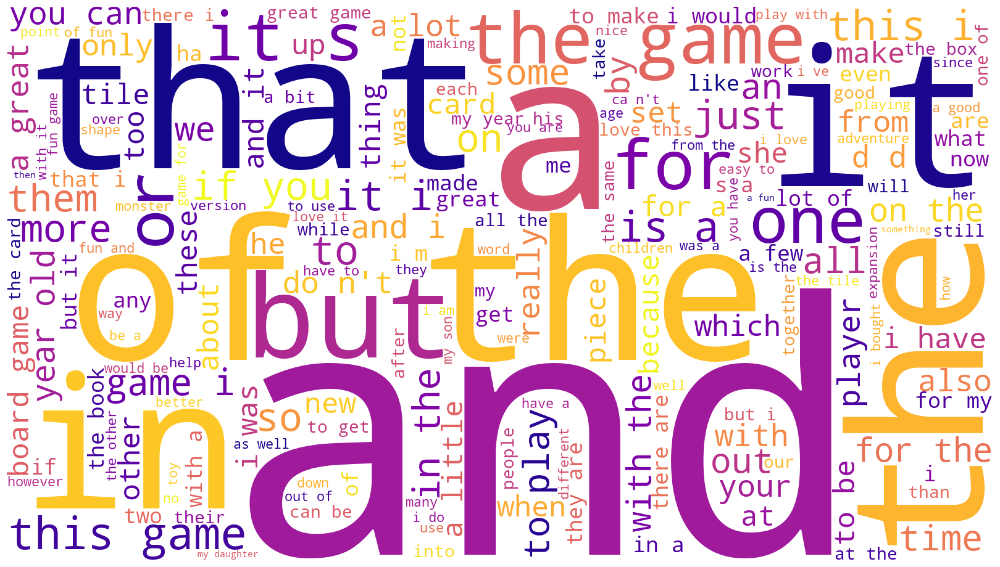

In [52]:
# Review: Plot the WordCloud image.
# Set the colour palette.
sns.set(color_codes=True)

# Create a WordCloud object without removing stopwords.
word_cloud = WordCloud(width=1600, height=900, 
                       background_color='white',
                       colormap='plasma', 
                       stopwords='none',  
                       min_font_size=10).generate(all_reviews)

# Plot the WordCloud image.
plt.figure(figsize=(16, 9), facecolor=None) 
plt.imshow(word_cloud) 
plt.axis('off') 
plt.tight_layout(pad=0) 
plt.show()


In [53]:
# Summary: Create a word cloud.

# Initialize an empty string.
all_summary = ''

# Iterate through the rows and join the lists of words.
for index, row in df5.iterrows():
    # Ensure each element in the list is a string before joining.
    all_summary += ' '.join(map(str, row['summary'])) + ' '

# Now, all_reviews contains the concatenated text.
print(all_summary)

the fact that 50 % of this space is wasted on art ( and not terribly informative or needed art ... another worthless dungeon master 's screen from galeforce9 pretty , but also pretty useless five stars money trap five stars best gm screen ever five stars great but could be even better another missed opportunity . not a value add to the product line . five stars love the map ! not a general dm screen very weak game fell completely flat ... five stars good book buckley was a card mommer very advanced , but as good as it gets you better know what you 're getting into do n't bother the worst value i 've ever seen not enough product good product but ... temporary tattoos were good gift . huge hit gorgeous pictures ! five stars wonderful designs . wow , great coloring book ! ! ! ! ! ! nice book great pictures perfect ! well done .... my relaxation beautiful coloring book the pictures are great , i 've done one and gave it to a ... great buy ! ca n't wait to work on this book stained glass pe

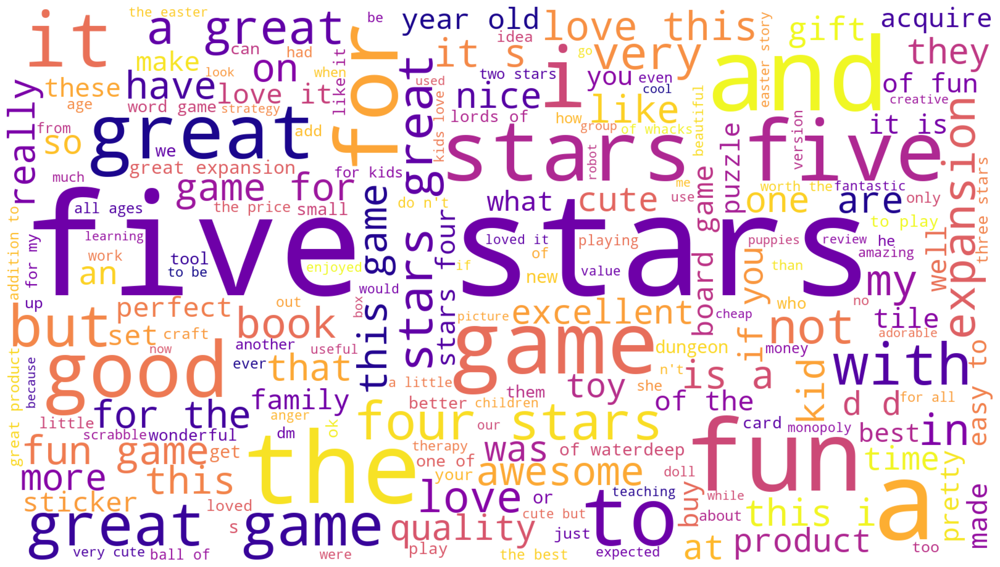

In [54]:
# Summary: Plot the WordCloud image.
# Set the colour palette.
sns.set(color_codes=True)

# Create a WordCloud object.
word_cloud = WordCloud(width = 1600, height = 900, 
                background_color ='white',
                colormap = 'plasma',
                stopwords='none',
                min_font_size = 10).generate(all_summary)


# Plot the WordCloud image.                    
plt.figure(figsize = (16, 9), facecolor = None) 
plt.imshow(word_cloud) 
plt.axis('off') 
plt.tight_layout(pad = 0) 
plt.show()


## 4. Frequency distribution and polarity
### 4a) Create frequency distribution

In [55]:
# Determine the frequency distribution.
rev_freq = FreqDist(all_reviews)
sum_freq = FreqDist(all_summary)


### 4b) Remove alphanumeric characters and stopwords

In [56]:
# Assuming all_reviews and all_summary are strings containing text data.
all_reviews = ' '.join([word for word in all_reviews.split() if word.isalnum()])
all_summary = ' '.join([word for word in all_summary.split() if word.isalnum()])


# Create a wordcloud without stop words.
english_stopwords = set(stopwords.words('english'))

# Remove stopwords from your text.
filtered_reviews = [word for word in all_reviews.split() if word not in english_stopwords]
filtered_summary = [word for word in all_summary.split() if word not in english_stopwords]


# Join the filtered words back into a string.
filtered_reviews_string = ' '.join(filtered_reviews)
filtered_summary_string = ' '.join(filtered_summary)



### 4c) Create wordcloud without stopwords

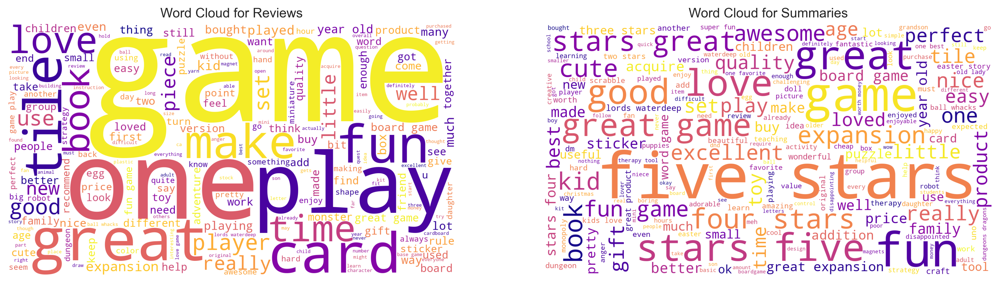

In [57]:
# Create WordCloud objects and generate word clouds.
wordcloud_reviews = WordCloud(width=1600, height=900, background_color='white', 
                              colormap='plasma', min_font_size=10).generate(filtered_reviews_string)
wordcloud_summary = WordCloud(width=1600, height=900, background_color='white', colormap='plasma', 
                              min_font_size=10).generate(filtered_summary_string)

# Display the word clouds.
plt.figure(figsize=(16, 9), dpi=300)

plt.subplot(1, 2, 1)
plt.imshow(wordcloud_reviews, interpolation='bilinear')
plt.axis("off")
plt.title("Word Cloud for Reviews")

plt.subplot(1, 2, 2)
plt.imshow(wordcloud_summary, interpolation='bilinear')
plt.axis("off")
plt.title("Word Cloud for Summaries")

plt.show()

### 4d) Identify 15 most common words and polarity

In [58]:
import nltk
import pandas as pd
from textblob import TextBlob

# Download necessary resources
nltk.download('punkt')

# Determine the 15 most common words.
reviews_words = FreqDist(filtered_reviews)
reviews_word_freq = reviews_words.most_common(15)

# Convert the list of tuples into a DataFrame
most_common_review_words = pd.DataFrame(reviews_word_freq, columns=['Word', 'Frequency'])

# Set the 'Word' column as the DataFrame index
most_common_review_words.set_index('Word', inplace=True)

# Define a function to get the polarity score of a word using TextBlob
def get_polarity_score(word):
    analysis = TextBlob(word)
    return analysis.sentiment.polarity

# Apply the get_polarity_score function to the 'Word' column and create a new 'Polarity' column
most_common_review_words['Polarity'] = most_common_review_words.index.to_series().apply(lambda word: get_polarity_score(word))

# Display the DataFrame with polarity scores
most_common_review_words


[nltk_data] Downloading package punkt to /Users/spyros/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


,Frequency,Polarity
Word,,
game,1693,-0.4
great,587,0.8
fun,555,0.3
one,532,0.0
play,504,0.0
like,414,0.0
love,325,0.5
get,320,0.0
really,318,0.2


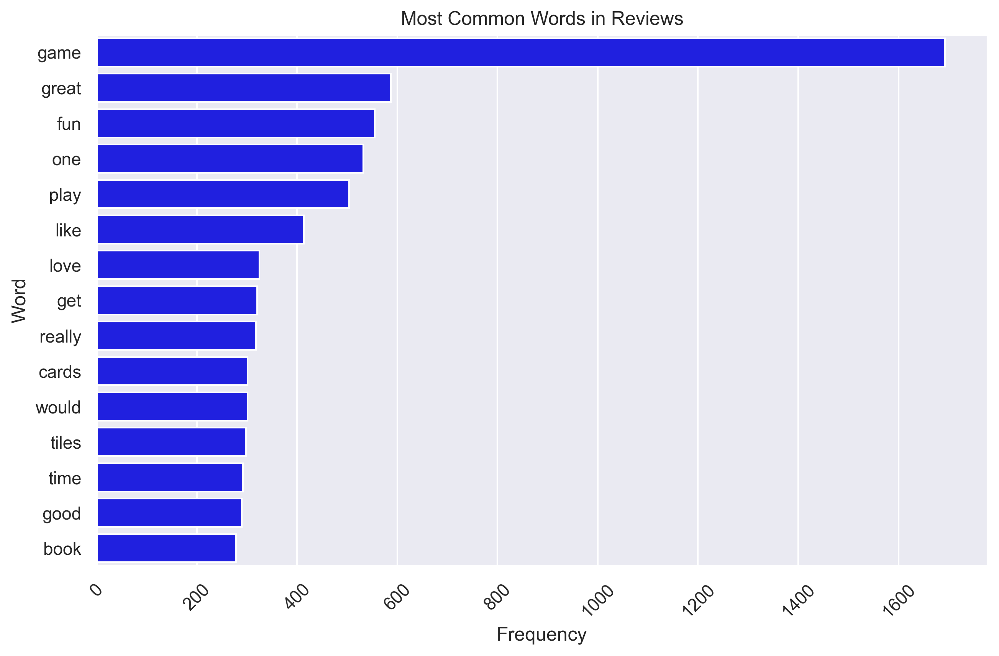

In [59]:
# Create the bar plot for better visualisation
plt.figure(figsize=(10, 6), dpi=300)
sns.barplot(data=most_common_review_words, y=most_common_review_words.index, x='Frequency', color='blue')

# Customize the plot as needed (e.g., labels, titles, rotation)
plt.xlabel('Frequency')
plt.title('Most Common Words in Reviews')
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility

# Show the plot
plt.show()

In [60]:
# Determine the 15 most common words.
summary_words = FreqDist(filtered_summary)
summary_word_freq = summary_words.most_common(15)

# Convert the list of tuples into a DataFrame
most_common_summary_words = pd.DataFrame(summary_word_freq, columns=['Word', 'Frequency'])

# Set the 'Word' column as the DataFrame index
most_common_summary_words.set_index('Word', inplace=True)

# Apply the get_polarity_score function to the 'Word' column and create a new 'Polarity' column
most_common_summary_words['Polarity'] = most_common_summary_words.index.to_series().apply(lambda word: get_polarity_score(word))

# Display the DataFrame with polarity scores
most_common_summary_words


,Frequency,Polarity
Word,,
stars,441,0.0
five,356,0.0
game,318,-0.4
great,294,0.8
fun,217,0.3
love,93,0.5
good,92,0.7
four,58,0.0
like,54,0.0


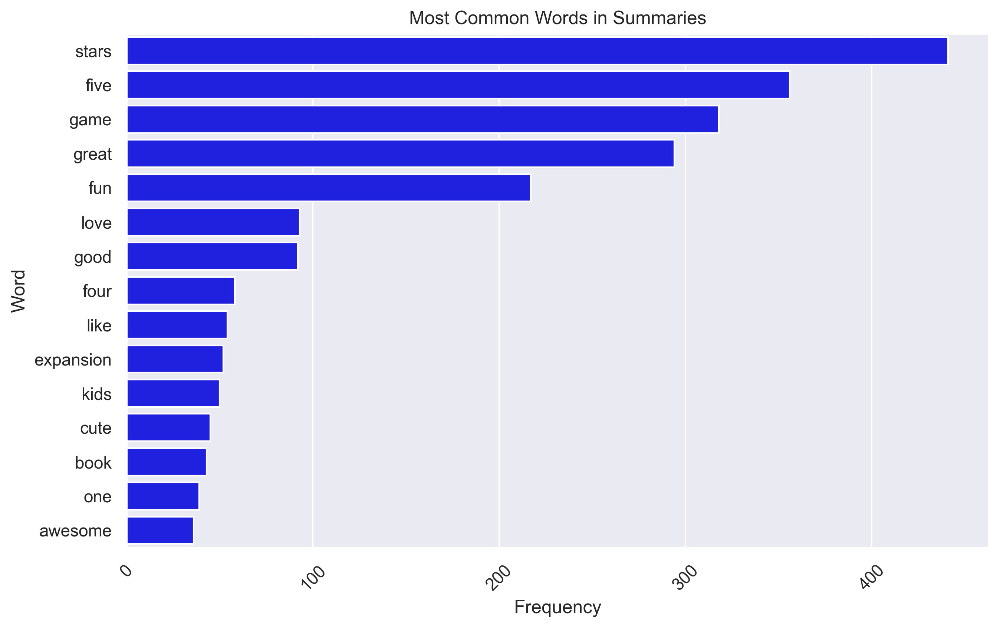

In [61]:
# Create the bar plot for better visualisation
plt.figure(figsize=(10, 6), dpi=300)
sns.barplot(data=most_common_summary_words, y=most_common_summary_words.index, x='Frequency', color='blue')

# Customize the plot as needed (e.g., labels, titles, rotation)
plt.xlabel('Frequency')
plt.title('Most Common Words in Summaries')
plt.xticks(rotation=45)  # Rotate x-axis labels for better visibility

# Show the plot
plt.show()

In [62]:
# identify the reviews with the word book
filtered_df = df4[df4['review'].apply(lambda x: 'book' in x)]
with pd.option_context('display.max_colwidth', None):
  display(filtered_df)


,review,summary
9,"my review will mirror others in that this kind of misses the mark and there are some lost opportunities to help dm's. i wouldn't advise new dm's to use this by itself. they should stick to the generic 5e dm screen and just copy/print the other useful information for skt. i do like that the information they did put in the screen was relevant to the game and makes accessible some of the frequently visited tables from the adventure book. i also like the map from the perspective that it contains the page references to the cities and locations. this is pretty useful, especially during ch 3 of the adventure. however, there is a very large amount of wasted space that could easily have been utilized instead of having the whole map take up 2 panels of the screen. the middle of the ocean could have contained info on the giant hierarchy, the giant rune symbols, the random encounters at sea table from the dmg, trap tables, or any number of other usefully applicable information to the story. i would have done away with the sea portion of the map completely and used that space more efficiently. in all actuality, the entire map could have been an extra insert, freeing up far more space and making this product far more appealing...or the adventure book could have included it as a tear out. there should have been better collaboration on this product. on a different note, the printing on my copy of the screen was not sized correctly. the left and right creases are right over the edge of the words...especially on the right side. it is almost illegible when the screen is up and in it's general position at the gaming table.(see attached pic) i can understand the idea and desire to produce tailored dm screens for these adventure books, but i don't feel they've truly taken the time to get feedback on their ideas from enough sources before printing. it's coming across as licensed money grab instead of a value add product to the adventure line.",another missed opportunity. not a value add to the product line.
16,"pretty good book with a variety of unique card sleights (palming, manipulating cards in the deck, etc.). these sleights are the 'real work', so it will take a little perseverance. many of these utility sleights are ones that you ought to know if you want to be a card sleight-of-hand worker. the instructions are generally clear, but sometimes a detail here and there gets a little confusing. there's a fair number of photos showing how to do many of the sleights. sometimes a sleight is a little more complicated than it needs to be. my recommendation is to follow the author's steps in slow-motion with a deck of cards in hand. after you are familiar with the overall effect, you can make adjustments based on what your comfortable with. there may also be other newer methods for learning these sleights if you want to invest in newer card sleight instruction (such as the daryl encyclopedia of card sleights videos, etc.). right now, i'm working on the side steal sleight. he gives a t. nelson downs version which has some merit, but it is much more complicated than necessary. the author's own version is a little more do-able. but even the author's method becomes a little too fidgety, so i've made minor modifications to make it work well for me. i start in slow-motion, counting through the substeps to keep pace while i do the move (1..2..3..4). then i repeat it until i can bring it up to full speed. if you want to learn sleights for cheap, try this book. you may have to pick and choose through the sleights, and there may be better methods to perform some of these sleights now, but it's not bad for under $10.",good book
17,"when i unexpectedly came across a picture of buckley on the first page of the book, and after hearing the other reviews of how difficult and advanced the techniques in the book were, i couldn't believe my eyes. i was surprised to see the face of a handsome teenager, of which my previous impression was completely the o

## 5. Review polarity and sentiment: Plot histograms of polarity (use 15 bins) and sentiment scores for the respective columns.

In [63]:
import pandas as pd
import nltk
import matplotlib.pyplot as plt 
import seaborn as sns
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from nltk.probability import FreqDist
from nltk.stem import SnowballStemmer, WordNetLemmatizer
import matplotlib.pyplot as plt
from wordcloud import WordCloud
from nltk.tokenize import word_tokenize
from nltk.corpus import words


# Initialize the NLTK VADER sentiment analyzer
sid = SentimentIntensityAnalyzer()


review_scores = df4[['review']]
text = review_scores['review'][i]


#tokenize the review into sentences and words using NLTK's tokenizers.
sentences = sent_tokenize(text)
words = [word_tokenize(sentence) for sentence in sentences]
 
# Remove stopwords
stop_words = set(stopwords.words('english'))
words = [[word for word in sentence if word.lower() not in stop_words] for sentence in words]

# Lemmatization of the remaining words in each sentence, reducing them to their base form
lemmatizer = WordNetLemmatizer()
words = [[lemmatizer.lemmatize(word) for word in sentence] for sentence in words]

#Now that we've done the lemmatization, we now combine each of the remaining words into sentences again. And then we calculate the sentiment polarity scores for each sentence
df_polarity = {" ".join(_) : sid.polarity_scores(" ".join(_)) for _ in words} #this just joins all the individual words in sentences

#this is the compound score for each sentiment
compound_scores = [score['compound'] for score in df_polarity.values()]

 #calculate the average sentiment score for all sentences in the review
final_sentiment = sum(compound_scores) / len(compound_scores)

#iterates through each review in the DataFrame. It retrieves the text of each review
review_sentiment = []
processed_text = []

for i in range(0,len(review_scores)):
    text = review_scores['review'][i]

    #tokenize the review into sentences and words using NLTK's tokenizers.
    sentences = sent_tokenize(text)
    words = [word_tokenize(sentence) for sentence in sentences]
     
    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    words = [[word for word in sentence if word.lower() not in stop_words] for sentence in words]
    
    # Lemmatization of the remaining words in each sentence, reducing them to their base form
    lemmatizer = WordNetLemmatizer()
    words = [[lemmatizer.lemmatize(word) for word in sentence] for sentence in words]
    
    #Now that we've done the lemmatization, we now combine each of the remaining words into sentences again. And then we calculate the sentiment polarity scores for each sentence
    df4_polarity = {" ".join(_) : sid.polarity_scores(" ".join(_)) for _ in words} #this just joins all the individual words in sentences
    
    #this is the compound score for each sentiment
    compound_scores = [score['compound'] for score in df4_polarity.values()]
    
     #calculate the average sentiment score for all sentences in the review
    final_sentiment = sum(compound_scores) / len(compound_scores)
    
    #final_sentiment score is added to the review_sentiment list,the preprocessed words are added to the processed_text list for later use.
    review_sentiment.append(final_sentiment)
    processed_text.append(words)
    
    
#this code adds two new columns to the DataFrame: 'Processed Text' containing the preprocessed words and 'Sentiment' containing the sentiment scores for each review.
review_scores['Processed Text'] = processed_text
review_scores['Sentiment'] = review_sentiment




review_scores


,review,Processed Text,Sentiment
0,"when it comes to a dm's screen, the space on t...","[[come, dm, 's, screen, ,, space, screen, abso...",-0.386225
1,an open letter to galeforce9*: your unpainted ...,"[[open, letter, galeforce9, *, :, unpainted, m...",0.072730
2,"nice art, nice printing. why two panels are fi...","[[nice, art, ,, nice, printing, .], [two, pane...",-0.011779
3,amazing buy! bought it as a gift for our new d...,"[[amazing, buy, !], [bought, gift, new, dm, 's...",0.703950
4,as my review of gf9's previous screens these w...,"[[review, gf9, 's, previous, screen, completel...",-0.445900
...,...,...,...
1970,the perfect word game for mixed ages (with mom...,"[[perfect, word, game, mixed, age, (, mom, ,, ...",0.743800
1971,great game. did not think i would like it when...,"[[great, game, .], [think, would, like, first,...",0.475633
1972,great game for all......... keeps the mind nim...,"[[great, game, ........., keep, mind, nimble, !]]",0.658800
1973,fun game!,"[[fun, game, !]]",0.556200


In [64]:
# Function to analyze sentiment and return scores as a dictionary
def analyze_sentiment(processed_text):
    # Apply sentiment analysis to each processed text and return the list of sentiment scores
    sentiment_scores = [sid.polarity_scores(" ".join(words)) for words in processed_text]
    
    return sentiment_scores

# Apply the sentiment analysis function to the 'Processed Text' column
review_scores['Sentiment'] = review_scores['Processed Text'].apply(analyze_sentiment)


In [65]:
# Extract the sentiment scores into separate columns
review_scores['neu'] = review_scores['Sentiment'].apply(lambda x: x[0]['neu'])
review_scores['pos'] = review_scores['Sentiment'].apply(lambda x: x[0]['pos'])
review_scores['compound'] = review_scores['Sentiment'].apply(lambda x: x[0]['compound'])
review_scores['neg'] = review_scores['Sentiment'].apply(lambda x: x[0]['neg'])

# Drop the original 'Sentiment' column if it's no longer needed
review_scores = review_scores.drop(columns=['Sentiment'])

# Display the DataFrame with the additional sentiment score columns
review_scores[['review', 'neu', 'pos', 'compound', 'neg']]



,review,neu,pos,compound,neg
0,"when it comes to a dm's screen, the space on t...",1.000,0.000,0.0000,0.000
1,an open letter to galeforce9*: your unpainted ...,0.588,0.000,-0.5423,0.412
2,"nice art, nice printing. why two panels are fi...",0.263,0.737,0.6808,0.000
3,amazing buy! bought it as a gift for our new d...,0.196,0.804,0.6239,0.000
4,as my review of gf9's previous screens these w...,0.723,0.000,-0.4703,0.277
...,...,...,...,...,...
1970,the perfect word game for mixed ages (with mom...,0.514,0.486,0.8180,0.000
1971,great game. did not think i would like it when...,0.196,0.804,0.6249,0.000
1972,great game for all......... keeps the mind nim...,0.532,0.468,0.6588,0.000
1973,fun game!,0.218,0.782,0.5562,0.000


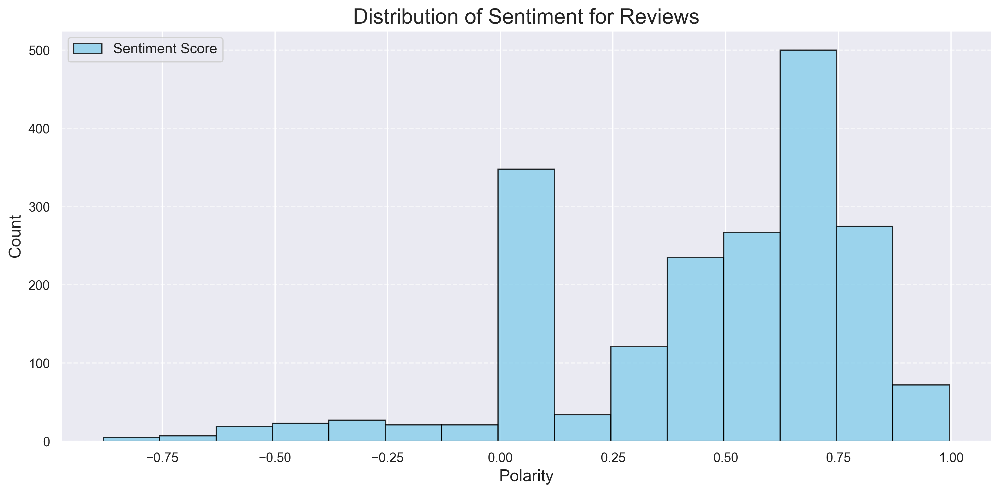

In [66]:
# Set the number of bins.
num_bins =15

# Set the plot area.
plt.figure(figsize=(12, 6), dpi=300)

# Define the bars with custom colors.
n, bins, patches = plt.hist(review_scores['compound'], num_bins, color='skyblue', alpha=0.8, edgecolor='black')

# Set the labels and title with increased font sizes.
plt.xlabel('Polarity', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Distribution of Sentiment for Reviews', fontsize=18)

# Add grid lines for better readability.
plt.grid(axis='y', linestyle='--', alpha=0.6)

# Add a legend to explain the colors.
plt.legend(handles=[patches[0]], labels=['Sentiment Score'], fontsize=12)

# Show the plot.
plt.tight_layout()
plt.show()


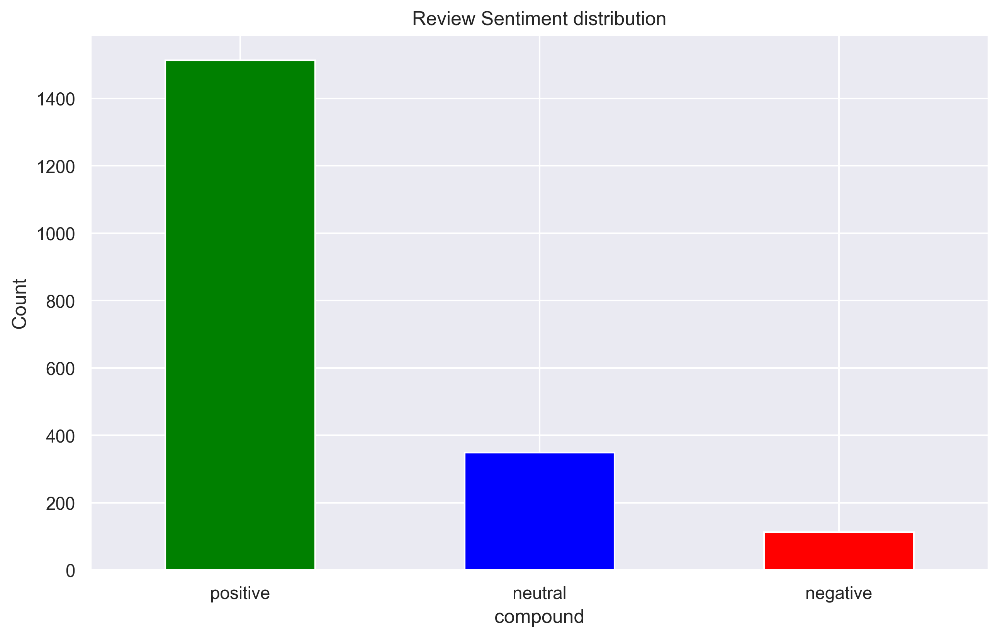

In [67]:
# Count the occurrences of each sentiment category
reviews_sent_counts = pd.cut(review_scores['compound'], bins=[-1, -0.1, 0.1, 1], labels=['negative', 'neutral', 'positive']).value_counts()

# Define custom colors for each sentiment category
colors = {'positive': 'green', 'neutral': 'blue', 'negative': 'red'}

# Create a figure with custom DPI
plt.figure(figsize=(10, 6), dpi=300)

# Create a bar plot (histogram) of the sentiment categories with custom colors
ax = reviews_sent_counts.plot(kind='bar', color=[colors.get(x, 'gray') for x in reviews_sent_counts.index])

# Add labels and a title to the plot
plt.ylabel('Count')
plt.title('Review Sentiment distribution')

# Rotate x-axis labels by 45 degrees
plt.xticks(rotation=0)  # You can adjust the rotation angle if needed

# Show the plot
plt.show()


***Sentiment for Summaries***

In [68]:
#sentiment analysis for the summary column
# Initialize the NLTK VADER sentiment analyzer
sid = SentimentIntensityAnalyzer()


summary_scores = df4[['summary']]
text = summary_scores['summary'][i]


#tokenize the review into sentences and words using NLTK's tokenizers.
sentences = sent_tokenize(text)
words = [word_tokenize(sentence) for sentence in sentences]
 
# Remove stopwords
stop_words = set(stopwords.words('english'))
words = [[word for word in sentence if word.lower() not in stop_words] for sentence in words]

# Lemmatization of the remaining words in each sentence, reducing them to their base form
lemmatizer = WordNetLemmatizer()
words = [[lemmatizer.lemmatize(word) for word in sentence] for sentence in words]

#Now that we've done the lemmatization, we now combine each of the remaining words into sentences again. And then we calculate the sentiment polarity scores for each sentence
df_polarity = {" ".join(_) : sid.polarity_scores(" ".join(_)) for _ in words} #this just joins all the individual words in sentences

#this is the compound score for each sentiment
compound_scores = [score['compound'] for score in df_polarity.values()]

 #calculate the average sentiment score for all sentences in the review
final_sentiment = sum(compound_scores) / len(compound_scores)

#iterates through each review in the DataFrame. It retrieves the text of each review
summary_sentiment = []
processed_text = []

for i in range(0,len(summary_scores)):
    text = summary_scores['summary'][i]

    #tokenize the review into sentences and words using NLTK's tokenizers.
    sentences = sent_tokenize(text)
    words = [word_tokenize(sentence) for sentence in sentences]
     
    # Remove stopwords
    stop_words = set(stopwords.words('english'))
    words = [[word for word in sentence if word.lower() not in stop_words] for sentence in words]
    
    # Lemmatization of the remaining words in each sentence, reducing them to their base form
    lemmatizer = WordNetLemmatizer()
    words = [[lemmatizer.lemmatize(word) for word in sentence] for sentence in words]
    
    #Now that we've done the lemmatization, we now combine each of the remaining words into sentences again. And then we calculate the sentiment polarity scores for each sentence
    df4_polarity = {" ".join(_) : sid.polarity_scores(" ".join(_)) for _ in words} #this just joins all the individual words in sentences
    
    #this is the compound score for each sentiment
    compound_scores = [score['compound'] for score in df4_polarity.values()]
    
     #calculate the average sentiment score for all sentences in the review
    final_sentiment = sum(compound_scores) / len(compound_scores)
    
    #final_sentiment score is added to the review_sentiment list,the preprocessed words are added to the processed_text list for later use.
    summary_sentiment.append(final_sentiment)
    processed_text.append(words)
    
    
#this code adds two new columns to the DataFrame: 'Processed Text' containing the preprocessed words and 'Sentiment' containing the sentiment scores for each review.
summary_scores['Processed Text'] = processed_text
summary_scores['Sentiment'] = summary_sentiment




summary_scores


,summary,Processed Text,Sentiment
0,the fact that 50% of this space is wasted on a...,"[[fact, 50, %, space, wasted, art, (, terribly...",-0.7783
1,another worthless dungeon master's screen from...,"[[another, worthless, dungeon, master, 's, scr...",-0.4404
2,"pretty, but also pretty useless","[[pretty, ,, also, pretty, useless]]",0.5574
3,five stars,"[[five, star]]",0.0000
4,money trap,"[[money, trap]]",-0.3182
...,...,...,...
1970,the perfect word game for mixed ages (with mom,"[[perfect, word, game, mixed, age, (, mom]]",0.5719
1971,super fun,"[[super, fun]]",0.8020
1972,great game,"[[great, game]]",0.6249
1973,four stars,"[[four, star]]",0.0000


In [69]:
# Function to analyze sentiment and return scores as a dictionary
def analyze_sentiment(processed_text):
    # Apply sentiment analysis to each processed text and return the list of sentiment scores
    sentiment_scores = [sid.polarity_scores(" ".join(words)) for words in processed_text]
    
    return sentiment_scores

# Apply the sentiment analysis function to the 'Processed Text' column
summary_scores['Sentiment'] = summary_scores['Processed Text'].apply(analyze_sentiment)


In [70]:
# Extract the sentiment scores into separate columns
summary_scores['neu'] = summary_scores['Sentiment'].apply(lambda x: x[0]['neu'])
summary_scores['pos'] = summary_scores['Sentiment'].apply(lambda x: x[0]['pos'])
summary_scores['compound'] = summary_scores['Sentiment'].apply(lambda x: x[0]['compound'])
summary_scores['neg'] = summary_scores['Sentiment'].apply(lambda x: x[0]['neg'])

# Drop the original 'Sentiment' column if it's no longer needed
summary_scores = summary_scores.drop(columns=['Sentiment', 'Processed Text'])

# Display the DataFrame with the additional sentiment score columns
summary_scores[['summary', 'neu', 'pos', 'compound', 'neg']]

summary_scores

,summary,neu,pos,compound,neg
0,the fact that 50% of this space is wasted on a...,0.541,0.000,-0.7783,0.459
1,another worthless dungeon master's screen from...,0.674,0.000,-0.4404,0.326
2,"pretty, but also pretty useless",0.098,0.627,0.5574,0.275
3,five stars,1.000,0.000,0.0000,0.000
4,money trap,0.303,0.000,-0.3182,0.697
...,...,...,...,...,...
1970,the perfect word game for mixed ages (with mom,0.575,0.425,0.5719,0.000
1971,super fun,0.000,1.000,0.8020,0.000
1972,great game,0.196,0.804,0.6249,0.000
1973,four stars,1.000,0.000,0.0000,0.000


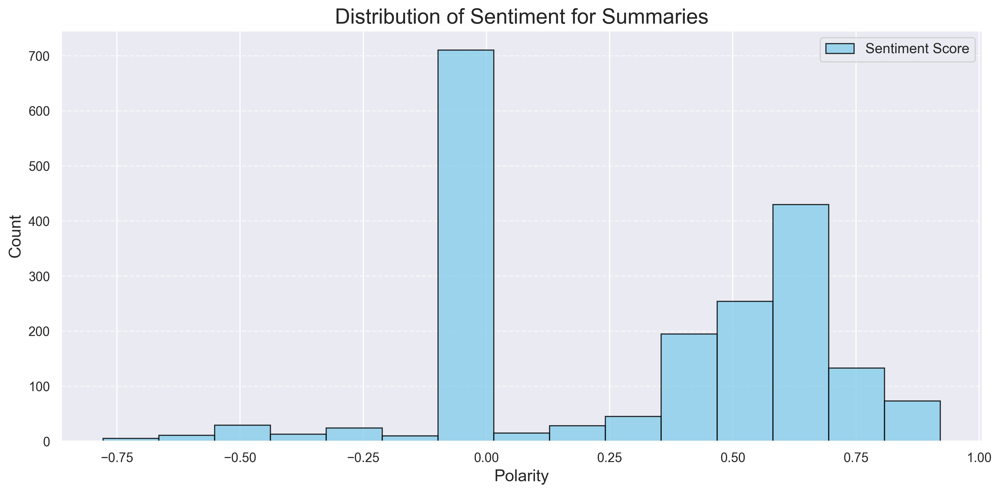

In [71]:
# Set the number of bins.
num_bins =15

# Set the plot area.
plt.figure(figsize=(12, 6), dpi=300)

# Define the bars with custom colors.
n, bins, patches = plt.hist(summary_scores['compound'], num_bins, color='skyblue', alpha=0.8, edgecolor='black')

# Set the labels and title with increased font sizes.
plt.xlabel('Polarity', fontsize=14)
plt.ylabel('Count', fontsize=14)
plt.title('Distribution of Sentiment for Summaries', fontsize=18)

# Add grid lines for better readability.
plt.grid(axis='y', linestyle='--', alpha=0.6)

# Add a legend to explain the colors.
plt.legend(handles=[patches[0]], labels=['Sentiment Score'], fontsize=12)

# Show the plot.
plt.tight_layout()
plt.show()


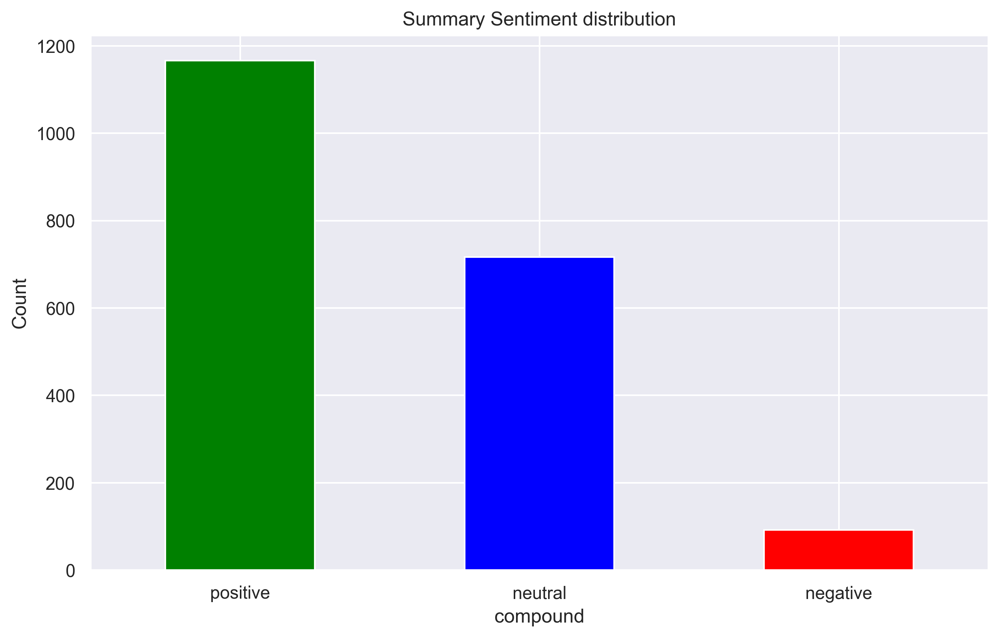

In [72]:
# Count the occurrences of each sentiment category
reviews_sent_counts = pd.cut(summary_scores['compound'], bins=[-1, -0.1, 0.1, 1], labels=['negative', 'neutral', 'positive']).value_counts()

# Define custom colors for each sentiment category
colors = {'positive': 'green', 'neutral': 'blue', 'negative': 'red'}

# Create a figure with custom DPI
plt.figure(figsize=(10, 6), dpi=300)

# Create a bar plot (histogram) of the sentiment categories with custom colors
ax = reviews_sent_counts.plot(kind='bar', color=[colors.get(x, 'gray') for x in reviews_sent_counts.index])

# Add labels and a title to the plot
plt.ylabel('Count')
plt.title('Summary Sentiment distribution')

# Rotate x-axis labels by 45 degrees
plt.xticks(rotation=0)  # You can adjust the rotation angle if needed

# Show the plot
plt.show()


In [73]:
# Calculate the average of the "Compound Score" column
average_review_score = review_scores['compound'].mean()

# Calculate the average of the "Compound Score" column
average_summary_score = summary_scores['compound'].mean()

# Print the average compound score
print("Average Compound Score for Reviews:", average_review_score)
# Print the average compound score
print("Average Compound Score for Summaries:", average_summary_score)


Average Compound Score for Reviews: 0.4413484556962025
Average Compound Score for Summaries: 0.3222883037974684


## 6. Identify top 20 positive and negative reviews and summaries respectively

In [74]:
#Display positive sentiment summaries
positive_sentiment_reviews = review_scores[['review', 'compound']].nlargest(20, 'compound')
with pd.option_context('display.max_colwidth', None):
  display(positive_sentiment_reviews)

,review,compound
1566,"nice good good great quick ship awesome good, nice awesome great good great loved it great good good great awesome",0.9959
155,this makes a great gift for anyone who loves super heroes and also loves to draw. top quality pencils too. and the best part....totally affordable.,0.9747
1608,pieces fit well easy for little hands happy bright ccolored pictures 2 & 3 year olds love it & stay focused counting animals,0.9693
1381,"i love the base game of lords of waterdeep - what a great intro game with awesome theme and as a bonus - easy to teach and learn. i was really excited for this expansion to come out to such a beloved game. sadly, this expansion was disappointing and i've owned it over a year now. i can honestly say this expansion makes my group of friends not want to play lords of waterdeep at all. not only does it add significant length to the game, but it's just not very interesting, or game changing. i like that there are two different expansions in the box, and you can chose to play with one or both at any given time. i must admit, there are a few really awesome new lords (which was much needed since larissa neathal was clearly overpowered in nearly every base game we'd play.) i think that perhaps there is a bit more added strategy in that in one of the expansions, there's tokens you take that can neg you points. the other expansion just offers larger quest cards and buildings. the board game collector in me will never give this expansion up, but i can say it's not essential to your enjoyment of lords of waterdeep.",0.9628
1070,if your a d&d fan this is agreat stand alone game to play but with the other ones it makes it even better you can play the normal way or just use it to form your own d&d adventures to play through with your friends so sit down and enjoy the adventures to come.,0.9607
1194,"with this i have like 3 products in one, is a like a deck with cards and miniatures included, i got two boxes to play with my bro and it has been awesome!, pity that wotc is not supporting this game anymore, totally recommend this game, for board game fans and card game fans alike. i play dnd as well, and this serve too well for implementing miniatures on that, both, players and monsters!",0.9577
1436,a great expansion for a great game well worth the priceyou can play with one or both of the the expansion i like to play with both.,0.9552
693,"love love love them, so much nicer than the traditional plastic letters.",0.9477
1326,"this expansion makes the base game superior in every way, it opens up the fan of options inmensly, the game transforms from making a lot of small effect desicions, to making huge moves, that swing the game in the favor of who ever can recognize and take adavantage of them, i played the base game dozens of times and after playing with the expansions a few times the base game feels stale compared with the new level of excitement you get with the expansion.",0.9451
1527,grand daughter loves stickers and she loves peppa so this was perfect..,0.9442


In [75]:
#Display negative sentiment reviews
negative_sentiment_reviews = review_scores[['review', 'compound']].nsmallest(20, 'compound')
with pd.option_context('display.max_colwidth', None):
  display(negative_sentiment_reviews)

,review,compound
1014,"the two notable negatives to this latest round of dnd-lite releases are: 1 - discouragingly varied element of 'randomness' - negative experiences that the players could not possibly have anticipated, accommodated, or dealt with. sometimes you just get stuck in a room full of lava with enemies that repeatedly paralyze you and your one chance to heal yourself fails. 2 - there's no real 'role playing' involved here - it's rpg--style combat, and your characters have some stats and equippable items, but you're just playing with 'pawns' in the end - no in-game incentives to actually include a story or 'play' a character. both of these shortcomings can easily be addresses with some judicious house-ruling or one of the players stepping up to 'play' the role of the dm (a position ostensibly unnecessary in this game) - but it's worth noting that out-of-the-box, these two elements do seem lacking. now - all that aside - this is a super fun and 'lite' way to get into an rpg tactics battle game, sort of an excellent introduction to larger scale miniature war games or more story-based rpg adventure scenarios, and it comes with a surprisingly useful collection of figures (the big boss characters are pretty rad) - as long as you know what you're sitting down to, it can really be a lot of fun to play.",-0.8807
1154,before this i hated running any rpg campaign dealing with towns because it kills the momentum and just becomes 2 hours of haggling for magic items. this helps open up story ideas and plot hooks.,-0.8720
501,"its really uno type game but anger control stuff...i don't like it due to younger children really don't respond well to anger management techniques...they do better with expectation management instead. these are ok, but i wouldn't buy them again.",-0.8266
860,"if you have never played acquire know that this negative review is not of the way the game is played. acquire is hands down my favorite board game. with that being said... spend a little more money on an older version of the game where the board and pieces are plastic. the cardboard pieces of this game will not hold up to use and will slide around the board easily. i was extremely disappointed when i received this and returned it immediately. again, spend some money on even a used older version of this game by 3m or avalon hill.",-0.7765
382,"so i work as a mental health clinician in a locked facility with adolescents who have some anger issues due to experiencing alot of trauma. they also have to deal with really really stupid rules, which triggers both them and myself. i'd say they are at ages 6-12, when it comes to controlling anger. with that said, this game was a lot of fun during session and in anger reduction group. it's just like uno with some anger control techniques and talking points thrown in! i love it and am extremely happy i bought this. it is so much fun and helps my adolescents talk about their anger and reframe that anger in a positive way!",-0.7579
346,my 8 year-old granddaughter and i were very frustrated and discouraged attempting this craft. it is definitely not for a young child. i too had difficulty understanding the directions. we were very disappointed!,-0.7269
459,"i am a licensed clinical social worker and use this game a lot in therapy with kids who have difficulty managing their anger. the game is straightforward and assists in starting the conversation of how to handle anger, or to strengthen skills. i recommend this game for any child struggling to manage emotions appropriately. it uses language so that therapists, teachers or parents can all utilize it with children. love this game!",-0.7269
1011,"as a disclaimer, one of my villain cards came with a factory defect where the machine burned into it but that should be a rarity. as far as the rest, these are the best miniatures i've ever had. the cave bears are my wife's favorite, while i love the otyugh! the insane number of orcs, duergar, extra kobolds and devils is fri

In [76]:
#Display positive sentiment summaries
positive_sentiment_summary = summary_scores[['summary', 'compound']].nlargest(20, 'compound')
with pd.option_context('display.max_colwidth', None):
  display(positive_sentiment_summary)

,summary,compound
1680,"great for playing, great for creative workshops too!",0.9215
1527,... loves stickers and she loves peppa so this was perfect..,0.9201
1111,wrath of ashardalon: great investment for an avid rpg fan who enjoys tabletop as well as crpgs,0.9186
1931,"easy to learn, great fun to play!",0.9184
1850,"easy, fun!, fast and thoroughly enjoyable for adults as well as kids age eight and above.",0.9011
698,"great quality, very cute and perfect for my toddler",0.8957
1477,he loves construction vehicles so i am sure he will love this also,0.8934
1825,"fun, friendly, beautiful game!",0.8932
1020,"great game, great value.",0.8910
1410,a useful and fun expansion to an already awesome game,0.8834


In [77]:
#Display negative sentiment summaries
negative_sentiment_summary = summary_scores[['summary', 'compound']].nsmallest(20, 'compound')
with pd.option_context('display.max_colwidth', None):
  display(negative_sentiment_summary)

,summary,compound
0,the fact that 50% of this space is wasted on art (and not terribly informative or needed art ...,-0.7783
1547,"the tardis, the doctor, river song, amy, rory fight every enemy - in cards!",-0.7500
327,defective- poor qc,-0.7184
1609,box totally destroyed!!!!!!!!!!!!!!!!!!!!!!!!,-0.6869
995,then you will find this board game to be dumb and boring,-0.6808
1149,"not a bad set, but with limited applicability.",-0.6597
1154,before this i hated running any rpg campaign dealing with towns because it ...,-0.6369
841,worst quality adult board game i've even seen,-0.6249
941,no 20 sided die,-0.5994
173,horrible! nothing more to say would give zero stars ...,-0.5848
